In [1]:
import numpy as np
import copy
import pickle

from scipy import ndimage
from BaselineRemoval import BaselineRemoval
import matplotlib.pyplot as plt
import os
from scipy import interpolate
from scipy import signal

plt.rcParams['figure.figsize'] = (20.0, 10.0)
# plt.rcParams['figure.figsize'] = (10.0, 5.0)
plt.rcParams['figure.dpi'] = 500
from IPython.display import display, HTML
display(HTML("<style>.container { width:98% !important; }</style>"))

Mogelijke verbeteringen:
 - maak de covariance afhankelijke van de noise 
 - draai de spectrum zodanig dat de globale sloop de x-as is. Zodat het min-max algorithme beter werkt. DONE
 - de smoothing die applied wordt door de covariantie moet afgesteld worden per sample

Problemen:
 - initializatie maakt uit voor de kalman smoother (hoeveel noise er is vs raman)
 - aantal iteratie maakt uit voor de kalman smoother (hoeveel noise er is vs raman)
 - de bounderies hebben geen invloed op de kalman smoother buiten alles binnen de bounderies houden.
   Tenzij smoothing ook aanstaat.
   
   
excitation laser maakt uit hoe de raman laser eruit ziet. Hoger (rood) betekend lower raman signal en een breder signal

date: 2-9-2022

 - stabilise the logic part with neighbourhood information
 - where the logic part is true make the line segments bigger (does not work)
 - find something to deterime the smoothness of the poly fit (no bumbs) DONE


### Ideas:

- Wavelet transform

### Errors:

 - smooth_grad fix the try except clause such that and the beginning and end of the spectrum it also works

In [125]:
file_location = "../data/Raman_Mouse/corrected_4_wavenumbers/"
# file_location = "../data/Green_excitation/corrected_4_wavenumbers/"

filenames = np.load(f"{file_location}FileNames.npy")
with open(f"{'/'.join(file_location.split('/')[:-2])}/Sample_labels.pickle", 'rb') as f:
    labels = pickle.load(f)
labels = {l.split(".")[0]: val for l, val in labels.items()}

wavenumbers = np.load(f"{file_location}Wavenumbers.npy")
    
data = []
for f in filenames:
    x = np.load(f"{file_location}{f.split('.')[0]}.npy")
    data.append(((x.reshape(-1,x.shape[-1])).reshape(x.shape), labels[f.split(".")[0]]))

In [222]:
rng = np.random.default_rng()
KALMAN_SMOOTHING = True
KALMAN_BOUNDARIES = True

class Kalman():    
    def __init__(self, X, grad, raman_grad, e, neighbourhood, photo_smoothness = 500, noise_smoothness = 2, correct_photo_appr_blacknoise=True):
        """
        noise_smoothness controls the amount of noise when set below zero, raman data will be seen as noise.
        high noise_smoothness means low noise (however a low number does not remove noise correctly)
        """
        
        self.X = X
        self.N_wavenumbers = self.X.shape[0]
        self.N_photo_appr = X.shape[1] - 1
        self.photo_smoothness = photo_smoothness
        self.noise_smoothness = noise_smoothness
        
        self.C = np.array([[1,1]] +
                           [[1,0]] * self.N_photo_appr)
        self.A = np.zeros((self.N_wavenumbers, 2, 2))
        self.A[:,0,0] = grad
        self.A[:,1,1] = raman_grad
#         self.A[:,1,1] = 1
        
        if correct_photo_appr_blacknoise:
            self.e = np.array([e] * X.shape[1])
        else:
            self.e = np.array([e] + [0] * self.N_photo_appr)
            
        self.n = neighbourhood
        self.mu = np.empty((self.N_wavenumbers, 2))
        self.M = np.empty((self.N_wavenumbers, 2, 2))
        self.nu = np.empty((self.N_wavenumbers+1, 2))
        self.V = np.empty((self.N_wavenumbers+1, 2, 2))
        self.J = np.empty((self.N_wavenumbers, 2, 2))

        self.nu[0] = [X[0,0], 0]
        
#         self.Sigma = np.diag(rng.standard_normal(1 + self.N_photo_appr))
#         self.Gamma = np.diag(rng.standard_normal(2))
#         self.V[0] = [[np.random.random(), 0],
#                      [0, np.random.random()]]
        self.Sigma = np.array([[5, 1], [1, 1]])
        self.Gamma = np.array([[1, 0], [0, 10]])
        self.V[0] = np.array([[1, 0], [0, 10]])
        
    @property
    def raw_data(self):
        return self.X, self.A[:,0,0]
    
    @raw_data.setter
    def raw_data(self, args):
        value, grad, raman_grad, *_ = args + [np.ones(self.X.shape)]
        self.X = value
        self.nu[0] = [self.X[0,0], 0]
        self.A[:,0,0] = grad
        self.A[:,1,1] = raman_grad
        self.EM(1)
        
    def _filter_step(self, i):
        CV = self.C @ self.V[i]
        b = self.C @ self.nu[i] + self.e
        B = CV @ self.C.T + self.Sigma
        K = self.V[i] @ self.C.T @ np.linalg.inv(B)
        self.mu[i] = self.nu[i] + K @ (self.X[i] - b)
        self.M[i] = self.V[i] - K @ CV

        # transition
        self.nu[i+1] = self.A[i] @ self.mu[i]
        self.V[i+1] = self.A[i] @ self.M[i] @ self.A[i] + self.Gamma # A = A.T
        self.b=b
        
        if KALMAN_BOUNDARIES:
            self.nu[i+1,0] = min(min(self.X[max(0,i-self.n):min(self.N_wavenumbers,i+self.n)+1,0]) - self.e[0], self.nu[i+1,0])
            self.nu[i+1,1] = max(0, self.nu[i+1,1])
        

    def _smoother_step(self, i):
        if KALMAN_BOUNDARIES:
            self.mu[i,0] = min(min(self.X[max(0,i-self.n):min(self.N_wavenumbers,i+self.n)+1,0]) - self.e[0], self.mu[i,0])
            self.mu[i,1] = max(0, self.mu[i,1])
        self.J[i] = self.M[i-1] @ self.A[i] @ np.linalg.inv(self.V[i])
        self.M[i-1] += self.J[i] @ (self.M[i] - self.V[i]) @ self.J[i].T
        self.mu[i-1] += self.J[i] @ (self.mu[i] - self.nu[i])
    
    def kalman_filter(self):
        self.tmp = []
        for i in range(len(self.X)):
            self._filter_step(i)
            self.tmp.append(self.b)
        self.tmp = np.array(self.tmp)
 
    def kalman_smoother(self):
        self.kalman_filter()
        for i in range(len(self.X)-1, -1, -1):
            self._smoother_step(i)
            
    def EM(self, n):
        for i in range(n):
            self.kalman_smoother()
            E_z = self.mu
            E_zz = self.M + self.mu.reshape(-1,self.mu.shape[1],1) @ self.mu.reshape(-1,1,self.mu.shape[1])
            E_z_1z = (self.J @ self.M)[1:] + self.mu[:-1].reshape(-1,self.mu.shape[1],1) @ self.mu[1:].reshape(-1,1,self.mu.shape[1])
            
            self.nu[0] = np.maximum(np.zeros(2), E_z[0])
            self.V[0] = self.V[2]
            
            # skip nu_0, V_0, A and C
            self.Gamma = np.sum(E_zz[1:] - 
                                E_z_1z.transpose(0,2,1) @ self.A[:-1].transpose(0,2,1) - 
                                self.A[:-1] @ E_z_1z + 
                                self.A[:-1] @ E_zz[:-1] @ self.A[:-1].transpose(0,2,1),
                                0) / self.N_wavenumbers

            self.Sigma = (self.X.T @ self.X - 
                         self.C @ E_z.T @ self.X - 
                         self.X.T @ E_z @ self.C.T + 
                         np.sum(self.C @ E_zz @ self.C.T, 0)) / (self.N_wavenumbers + 1)
                        
            # Sigma should not be a diagonal matrix
            # raw
            if KALMAN_SMOOTHING:
                self.Sigma[0,0] *= 5
                # photo
                self.Sigma[1,1] *= 1
                # cov
                new = self.Sigma[1,0] * 1
                self.Sigma[0,1], self.Sigma[1,0] = new, new
            # the covariance must be positive
            self.Sigma = np.maximum(np.ones((2,2)), self.Sigma)
#             print(self.Sigma)
            

#             make covarience diagonal          
            self.Gamma = np.diag(np.diag(self.Gamma)) 
            if KALMAN_SMOOTHING:
    #             self.Gamma[1,1] /= 10
                self.Gamma[0,0] /= 10
#             c = (self.Gamma[0,0] + self.Gamma[1,1]) / self.photo_smoothness
#             self.Gamma = np.diag([c, c*(self.photo_smoothness-1)])
            # the variance must be positive
            self.Gamma = np.maximum(np.eye(2), self.Gamma)
            
            
def split_signal(img):
    """ 
    img consists of data and label
    
    artefact due to using previous points 
    
    """
    black_noise = 0
    x = img[0].reshape(-1, img[0].shape[-1])
    #mouse image
#     n, noise_amount = 250, 3e5 
#     n, noise_amount = 85, 1e5 
    n, noise_amount = np.random.randint(x.shape[0]), 0.5e5
#     n, noise_amount = 1325, 2e5
    intervals = 10
    general_noise = 10e6
    poly_fit = 1e5
    precision = 12
    continue_gap = 100
    # green image
#     n, noise_amount = 250, 1e5
#     n, noise_amount = 85, 6e5 
#     n, noise_amount = np.random.randint(x.shape[0]), 3e5
#     general_noise = 5e6
#     intervals = 30
#     precision = 20
#     poly_fit = 8e5
#     continue_gap = 400


    print("pixel:", n)
    
    def zero_bound_to_None(bound):
        # -0 must be translate to None
        return -bound if bound != 0 else None

    def smooth_grad(poly2):
        general_grad_func = interpolate.UnivariateSpline(wavenumbers, 
                                                         poly2,
                                                         k=4, s=general_noise*5)
        general_grad = general_grad_func(wavenumbers)
        grad_general = general_grad[1:] - general_grad[:-1]
                
        grad = poly2[1:] - poly2[:-1]
        grad2 = np.pad(poly2[2:] - 2 * poly2[1:-1] + poly2[:-2],(1, 0), 'edge')

#         plt.plot(grad, label="grad")
#         plt.plot(grad_general, label="general grad")
        
        general_max_lst = signal.argrelmax(grad_general)[0]
        max_lst = signal.argrelmax(grad)[0]
        max_grad_lst = signal.argrelmax(grad2)[0]
        min_grad_lst = signal.argrelmin(grad2)[0]
#         print(max_lst)
#         print(max_grad_lst)
#         print(min_grad_lst)

        for max_ in max_lst:
            general_max = general_max_lst[np.argmin([abs(x - max_) for x in general_max_lst])]
            if abs(general_max - max_) < continue_gap/2:
#                 print("max to close", max_)
                continue
            
            try:
                *_, left = filter(lambda x: x < max_, max_grad_lst)
                right = next(filter(lambda x: x > max_, min_grad_lst))
            except (ValueError, StopIteration) as error:
#                 print("no left or right", max_)
                continue
    
            try:
                *_, left_max = filter(lambda x: x < max_, max_lst)
            except ValueError:
                left_max = 0

            try:
                right_max = next(filter(lambda x: x > max_, max_lst))
            except StopIteration:
                right_max = grad.shape[0]
                
            old_sum = sum(grad)
            restore_grad = copy.copy(grad)
            grad[left:max_] = grad[left]
            new_sum = sum(grad)
            i = max_

            dist = 3 * min(max_ - left, right - max_)
            dist = min(dist, max_ - left_max, right_max - max_)
#             print(left, max_, right, dist)
            while True:
                while new_sum < old_sum:
                    grad[i:i+10] = grad[left]
                    new_sum = sum(grad)
                    i += 10
                    if i > min(max_ + dist, grad.shape[0]):
                        left += 10
                        grad = copy.copy(restore_grad)
                        grad[left:max_] = grad[left]
                        new_sum = sum(grad)
                        i = max_
                        break
                else:
                    break
                                      
            flat_residu = (old_sum - new_sum) / (left-i)
            grad[left:i] -= flat_residu
            
            # if flatting of the maximum gradient is not possible skip
            if left >= max_:
                print("can not find smooth max", max_)
                continue
                        
            
            smooth_dist = max(2, min(i-left, continue_gap))
            sigma = smooth_dist/4
            smooth_dist2 = smooth_dist//2
            smooth_dist2b = smooth_dist - smooth_dist2
            smooth_dist3 = smooth_dist + smooth_dist2
            if left-smooth_dist3 < 0: # correct for maximums at the left part of the spectrum
                left_bound, gaus_left_bound = max(0, left-smooth_dist2), max(0, left-smooth_dist)
                grad[left_bound:i+smooth_dist2] = ndimage.gaussian_filter(grad[gaus_left_bound:i+smooth_dist], sigma, mode='nearest')[left_bound - gaus_left_bound:-smooth_dist2b]
                left_bound = max(0, left-smooth_dist)
                grad[left_bound: left+smooth_dist] = ndimage.gaussian_filter(grad[:left+smooth_dist3], sigma, mode='nearest')[left_bound:-smooth_dist2]
                left_bound, gaus_left_bound = max(0, i-smooth_dist), max(0, i-smooth_dist3)
                grad[left_bound:i+smooth_dist] = ndimage.gaussian_filter(grad[gaus_left_bound:i+smooth_dist3], sigma, mode='nearest')[left_bound - gaus_left_bound:-smooth_dist2]
            elif i + smooth_dist3 > grad.shape[0]: # correct for maximums at the right part of the spectrum
                right_bound, gaus_right_bound = max(grad.shape[0] - (i+smooth_dist2), 0), max(grad.shape[0] - (i+smooth_dist), 0)
                right_diff = right_bound - gaus_right_bound
                right_bound, gaus_right_bound, right_diff = zero_bound_to_None(right_bound), zero_bound_to_None(gaus_right_bound), zero_bound_to_None(right_diff)
                grad[left-smooth_dist2:right_bound] = ndimage.gaussian_filter(grad[left-smooth_dist:gaus_right_bound], sigma, mode='nearest')[smooth_dist2b:right_diff]
                right_bound, gaus_right_bound = max(grad.shape[0] - (left+smooth_dist), 0), max(grad.shape[0] - (left+smooth_dist3), 0)
                right_diff = right_bound - gaus_right_bound
                right_bound, gaus_right_bound, right_diff = zero_bound_to_None(right_bound), zero_bound_to_None(gaus_right_bound), zero_bound_to_None(right_diff)
                grad[left-smooth_dist:right_bound] = ndimage.gaussian_filter(grad[left-smooth_dist3:min(left+smooth_dist3, grad.shape[0])], sigma, mode='nearest')[smooth_dist2:right_diff]
                right_bound = max(grad.shape[0] - (i+smooth_dist), 0)
                right_bound = zero_bound_to_None(right_bound)
                grad[i-smooth_dist:right_bound] = ndimage.gaussian_filter(grad[i-smooth_dist3:], sigma, mode='nearest')[smooth_dist2:right_bound]
            else:
                grad[left-smooth_dist2:i+smooth_dist2] = ndimage.gaussian_filter(grad[left-smooth_dist:i+smooth_dist], sigma, mode='nearest')[smooth_dist2b:-smooth_dist2b]            
                grad[left-smooth_dist:left+smooth_dist] = ndimage.gaussian_filter(grad[left-smooth_dist3:left+smooth_dist3], sigma, mode='nearest')[smooth_dist2:-smooth_dist2]
                grad[i-smooth_dist:i+smooth_dist] = ndimage.gaussian_filter(grad[i-smooth_dist3:i+smooth_dist3], sigma, mode='nearest')[smooth_dist2:-smooth_dist2]
            
            new_sum = sum(grad)
            left_bound, right_bound = max(0,left-smooth_dist), min(i+smooth_dist, grad.shape[0])
            flat_residu = (old_sum - new_sum) / (left_bound - right_bound)
            grad[left_bound: right_bound] -= flat_residu

#         plt.plot(grad, label="new grad")
#         plt.legend()
#         plt.show()

#         plt.plot(wavenumbers, x[n], label="raw")
#         plt.plot(wavenumbers, poly2, label="poly")

        value = poly2[0]
        poly2 = [value]
        for g in grad:
            value += g
            poly2.append(value)
        poly2 = np.array(poly2)
        
#         plt.plot(wavenumbers, poly2, label="poly new")
#         plt.legend()
#         plt.show()
        
        return poly2
    
    """********************************************************************"""
    def poly_approximation(general, iteration, logic=None, weighted=False):
        if logic is None:
            general_grad_func = interpolate.UnivariateSpline(wavenumbers, 
                                                        general,
                                                        k=4, s=general_noise*5)
            general_grad = general_grad_func(wavenumbers)
            sec_grad2 = np.pad(general_grad[2:] - 2*general_grad[1:-1] + general_grad[:-2], (1, 1), 'edge')
            sec_grad1 = np.pad(general[2:] - 2*general[1:-1] + general[:-2], (1, 1), 'edge')
            grad = np.pad(general[1:] - general[:-1], (0,1), 'edge')
            grad_m = np.mean(np.abs(grad))
            small_grad = np.abs(grad) < grad_m
#             sec_grad_pos = (sec_grad1 < 0) * (sec_grad2 < 0)
            sec_grad_pos = (sec_grad2 < 0)
#             if iteration == 9:
#                 plt.plot(x[n],label="raw")
#                 plt.plot(general,label="general")
#                 plt.plot(general_grad,label="general grad")
#                 plt.plot((sec_grad1 < 0)*500+2100, label="grad sign general")
#                 plt.plot((sec_grad2 < 0)*500+2100, label="grad sign general_grad")
#                 plt.plot(small_grad*500+1400, label="grad 0")
#                 plt.plot(sec_grad_pos*500+1400, label="sec grad 0")
            small_grad = ndimage.minimum_filter(small_grad, size=continue_gap)
            sec_grad_pos = ndimage.minimum_filter(sec_grad_pos, size=continue_gap)
#             if iteration == 9:
#                 plt.plot(small_grad*500+700, label="grad 1")
#                 plt.plot(sec_grad_pos*500+700, label="sec grad 1")
            small_grad = ndimage.maximum_filter(small_grad, size=continue_gap)
            sec_grad_pos = ndimage.maximum_filter(sec_grad_pos, size=continue_gap)
            logic = sec_grad_pos * small_grad
#             if iteration == 9:
#                 plt.plot(small_grad*500, label="grad 2")
#                 plt.plot(sec_grad_pos*500, label="sec grad 2")
#                 plt.legend()
#                 plt.show()
        sec_grad_sign = ndimage.gaussian_filter(logic.astype(np.float32), 50)       
        
        if iteration == 9:
            plt.title("general slope")
            plt.plot(x[n],label="raw")
            plt.plot(general, label="general slope")
            try:
                plt.plot((sec_grad_pos)*1000, label="sec gradrient sign")
                plt.plot(small_grad * 1000, label="grad")
            except UnboundLocalError:
                pass
            plt.plot(sec_grad_sign*1000, label="logic")
            plt.legend()
            plt.show()

        minimums = []
        step = x[n].shape[0]//intervals
        for j in range(0, step, step//precision):
            x_ = copy.copy(x[n])
            # to adress exponential values at the left side of the spectrum, make these value higher
            if j > 0:
                new_step = x_[:j].shape[0]
                slope = general[:j]
                height = slope[-1] - slope[0]
                slope = np.linspace(0, height, new_step)
                index = np.argmin(x_[:j] - slope)
                slope -= slope[index]
                slope += x[n, index]
                x_[:j] = slope
            
            for i in range(j, x[n].shape[0]-1, step):
                step_size = step
                new_step = x_[i:i+step_size].shape[0]
                smooth_curve = general[i:i+new_step]
                height = smooth_curve[-1] - smooth_curve[0]
                slope = np.linspace(0, height, new_step)
                index = np.argmin(x_[i:i+new_step] - slope)
                slope -= slope[index]
                slope += x[n, i+index]
                x_[i:i+new_step] = slope
#             x_[:3] = copy.copy(x[n,:3])
            minimums.append(x_)
                  
            if iteration == 9:
                plt.plot(x_, label="raw minimized")

        if iteration == 9:
            plt.title("Min-max algorithm")
            plt.plot(x[n], label="raw")
            plt.show()

        poly_max = np.max(np.array(minimums), axis=0)
        poly_min = np.min(np.array(minimums), axis=0)
        poly = sec_grad_sign * poly_min + (1-sec_grad_sign) * poly_max

        if not weighted:
            func = interpolate.UnivariateSpline(wavenumbers, 
                                                poly,
                                                k=4, s=poly_fit)
            poly2 = func(wavenumbers)
            poly2 = smooth_grad(poly2)
            
        else:
            old_poly = poly-1
            j = 0
            while sum(poly-old_poly) and j < 5:
                j += 1
                func = interpolate.UnivariateSpline(wavenumbers, 
                                                    poly,
                                                    k=4, s=poly_fit)
                poly2 = func(wavenumbers)

    #             if iteration == 9:
    #                 plt.title("Min-max approximation of photo")
    #                 plt.plot(wavenumbers, x[n], label="raw")
    #                 plt.plot(wavenumbers, poly, label="photo approx")
    #                 plt.plot(wavenumbers, poly2, label="poly")
    #                 plt.plot(wavenumbers, (poly2 > x[n]) *1000, alpha=0.3, label="poly to high")
                old_poly = copy.copy(poly)

                """
                This pushes the poly graph down acting like a weight for the spline to fit the graph below x[n]
                """
                problem_part = ndimage.maximum_filter(ndimage.minimum_filter(poly2 > x[n], 3), continue_gap//5)
                poly -= problem_part * 5
    #             if iteration == 9:
    #                 plt.plot(wavenumbers, problem_part*1000, label="problem")
    #                 plt.legend()
    #                 plt.show()
            poly2 = smooth_grad(poly2)
            

        if iteration == 9:
            plt.title("Min-max approximation of photo")
            plt.plot(wavenumbers, x[n], label="raw")
            plt.plot(wavenumbers, poly, label="photo approx")
            plt.plot(wavenumbers, poly2, label="poly")
            plt.plot(wavenumbers, (poly2 > x[n]) *1000, alpha=0.3, label="poly to high")
            plt.legend()
            plt.show()

        return poly2, logic

    """********************************************************************"""

    correction_func = interpolate.UnivariateSpline(wavenumbers, 
                                                   x[n],
                                                   k=4, s=general_noise)
    general = correction_func(wavenumbers)
    poly2, logic = poly_approximation(general,9)
    for i in range(5):
        if i == 4:
            poly2, logic = poly_approximation(poly2, 9, weighted=True)
        else:
            poly2, logic = poly_approximation(poly2, i, weighted=True)
            
    grad = np.pad(poly2[1:] / poly2[:-1],(0, 1), 'edge')
                   
    raman = np.maximum(np.zeros(x[n].shape), x[n]-poly2) # make sure that all numbers are positive
    func = interpolate.UnivariateSpline(wavenumbers, 
                                        raman,
                                        k=4, s=noise_amount) #tweaked per sample [1e5, 6e5]
    raman2 = np.maximum(np.ones(x[n].shape), func(wavenumbers)) # make sure that x_n / x_n-1 < 0
    
    plt.title("approximate raman based on photo (this is cludes noise)")
    plt.plot(raman, label="approx raman")
    plt.plot(raman2, label="raman poly")
    plt.legend()
    plt.show()
       
    raman_grad = np.pad(raman2[1:] / raman2[:-1],(0, 1), 'edge')
    raman_grad = np.maximum(np.zeros(x[n].shape)+0.1, raman_grad)
    raman_grad = np.minimum(np.zeros(x[n].shape)+10, raman_grad)

    plt.title("the gradient of the approximate raman")
    plt.plot(raman_grad, label="raman poly grad")
    plt.legend()
    plt.show()   
    
    plt.title("all approximations")
    plt.plot(x[n], label="raw")
    plt.plot(poly2, label="poly")
    plt.plot(raman2, label='raman')
#     plt.ylim([-50, 4500])
    plt.legend()
    plt.show()
    
    obj = Kalman(np.stack((x[n], poly2)).T, grad, raman_grad, black_noise, neighbourhood=1, photo_smoothness=5000, noise_smoothness=1)
    obj.EM(10)
    
    plt.title("innerworkings of kalman filter")
    plt.plot(x[n], label="raw")
    plt.plot(obj.tmp[:,0], label="new raw", alpha=0.7)
    plt.legend()
    plt.show()

    plt.title("innerworkings of kalman filter")
    plt.plot(poly2, label="poly")
    plt.plot(obj.tmp[:,1], label="new poly", alpha=0.7)
    plt.legend()
    plt.show()
    
    plt.title("kalman filter results")
    plt.plot(wavenumbers,x[n], label="raw")
    plt.plot(wavenumbers,obj.mu[:,0], label="photo")
    plt.plot(wavenumbers,obj.mu[:,1], label="raman")
    plt.plot(wavenumbers,x[n] - obj.mu[:,0] - obj.mu[:,1], label="noise", alpha=0.5)
#     plt.ylim([-50, 4500])
    plt.legend()
    plt.show()
    
    from BaselineRemoval import BaselineRemoval

    baseObj = BaselineRemoval(x[n])
    Zhangfit_output = baseObj.ZhangFit()
    poly2 = x[n] - Zhangfit_output
   
    plt.title("Zhangfit results")
    plt.plot(wavenumbers,x[n], label="raw")
    plt.plot(wavenumbers, poly2, label="photo")
    plt.plot(wavenumbers, Zhangfit_output, label="raman")
#     plt.ylim([-50, 4500])
    plt.legend()
    plt.show()

    return
    
    raman = np.empty(x.shape)
    photo = np.empty(x.shape)
    
    for pixel in range(x.shape[0]):
        baseObj = BaselineRemoval(x[pixel])

#         Modpoly_output = baseObj.ModPoly(4)
        Zhangfit_output = baseObj.ZhangFit()

#         poly = x[pixel] - Modpoly_output
#         grad = ndimage.gaussian_filter(np.pad(poly[1:] / poly[:-1],(0, 1), 'edge'), 50)

        poly2 = x[pixel] - Zhangfit_output
        grad2 = ndimage.gaussian_filter(np.pad(poly2[1:] / poly2[:-1],(0, 1), 'edge'), 50)
    
        smooth_grad = ndimage.gaussian_filter(np.pad(poly2[1:] - poly2[:-1],(0, 1), 'edge'), 50)
        mask = np.abs(smooth_grad) > 0.1
        grad3 = grad2 * mask + (1-mask) * np.ones(grad2.shape)
        grad4 = ndimage.gaussian_filter(grad3, 100)

        smooth_poly = ndimage.gaussian_filter(poly2, 50)
    
        obj.raw_data = np.stack((x[pixel], smooth_poly)).T, grad4
        
        raman[pixel] = obj.mu[:,1]
        photo[pixel] = obj.mu[:,0]
        
    return raman, photo

pixel: 1793


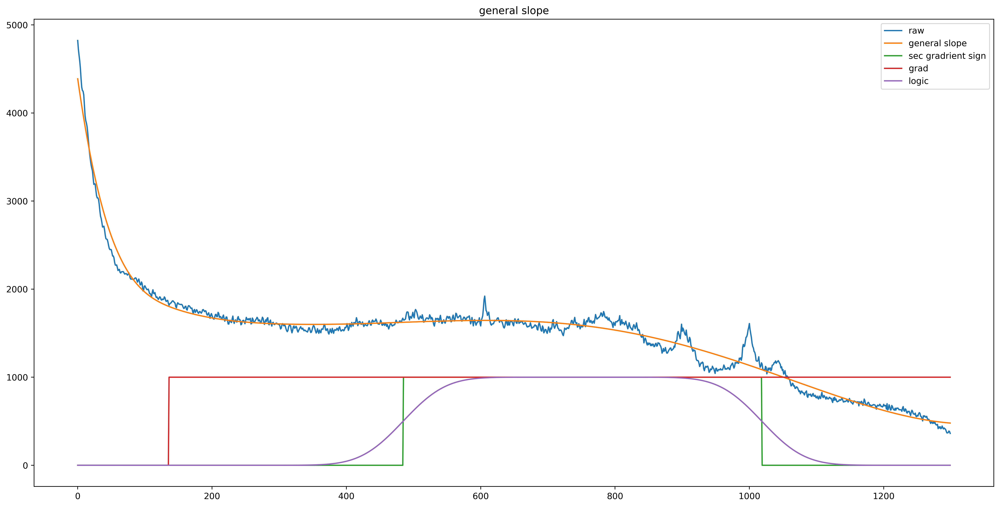

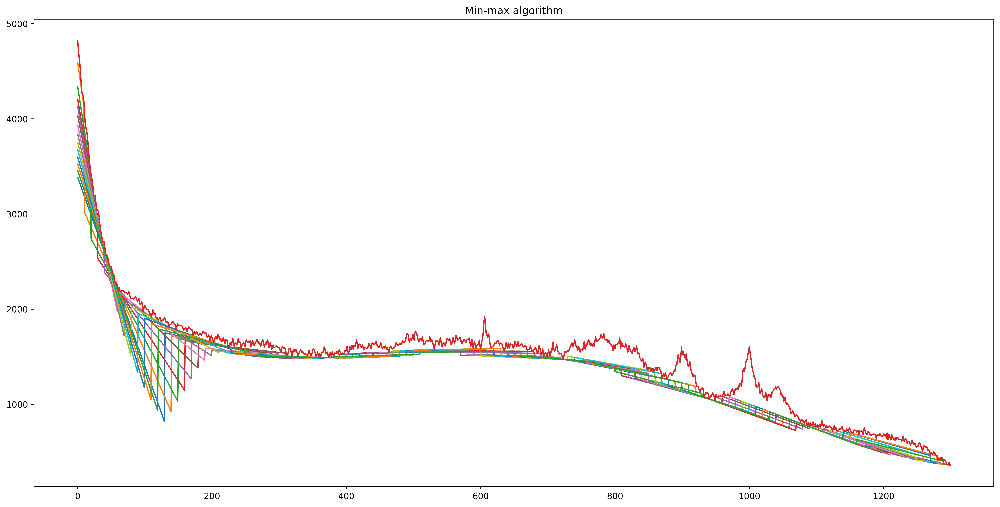

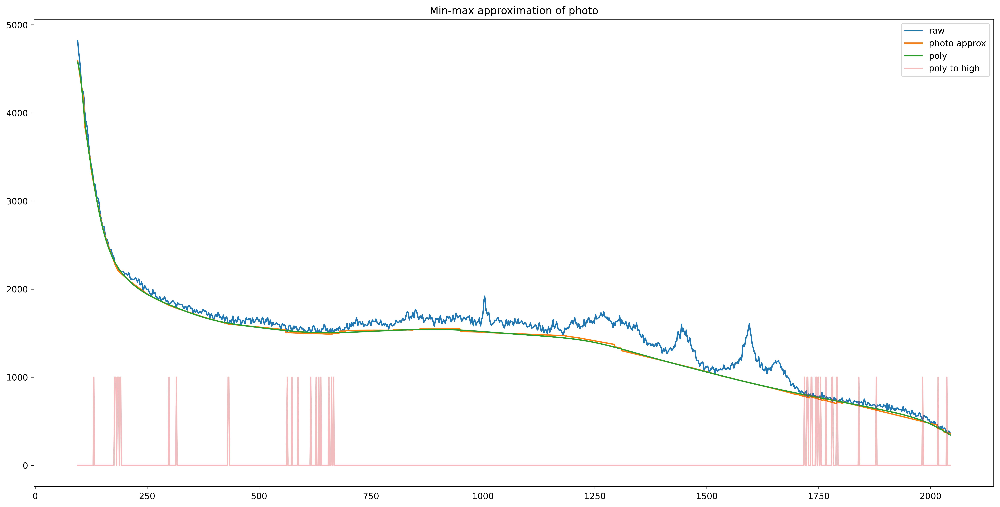

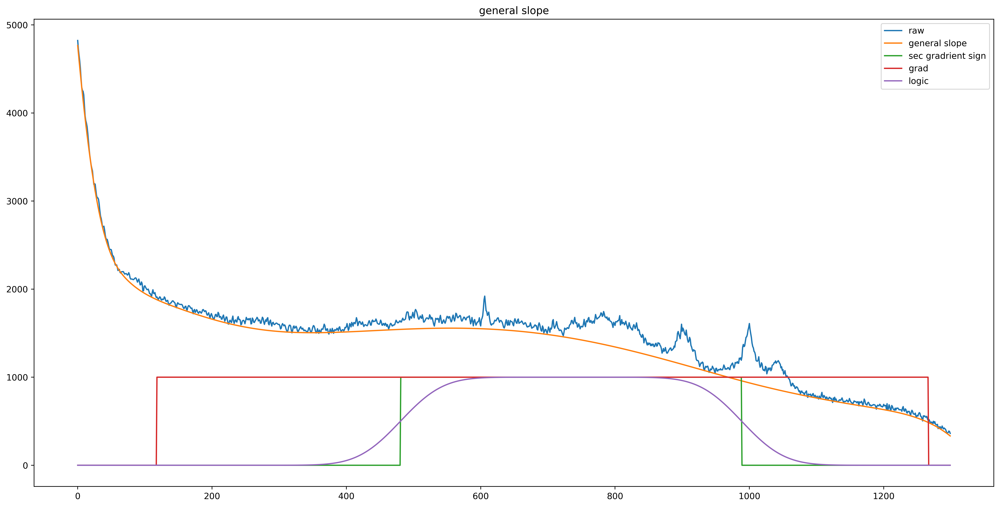

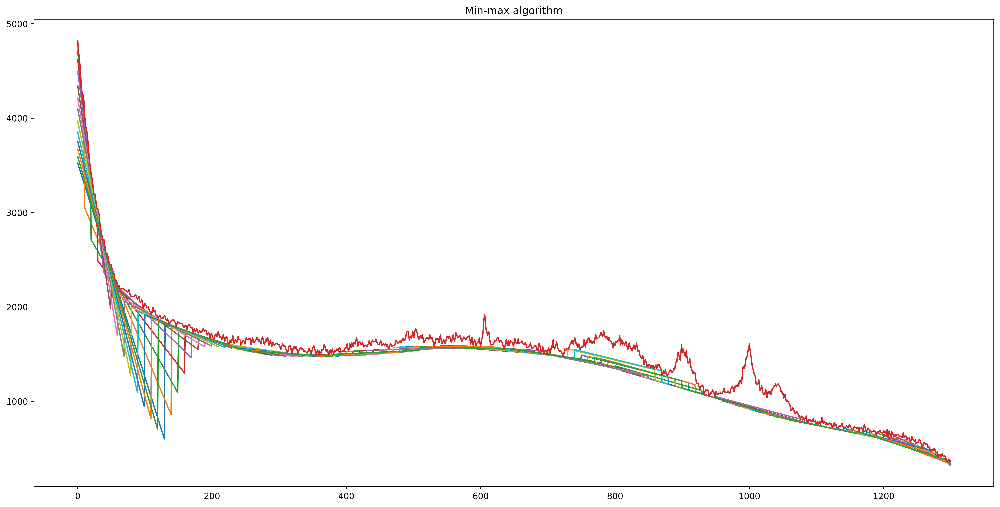

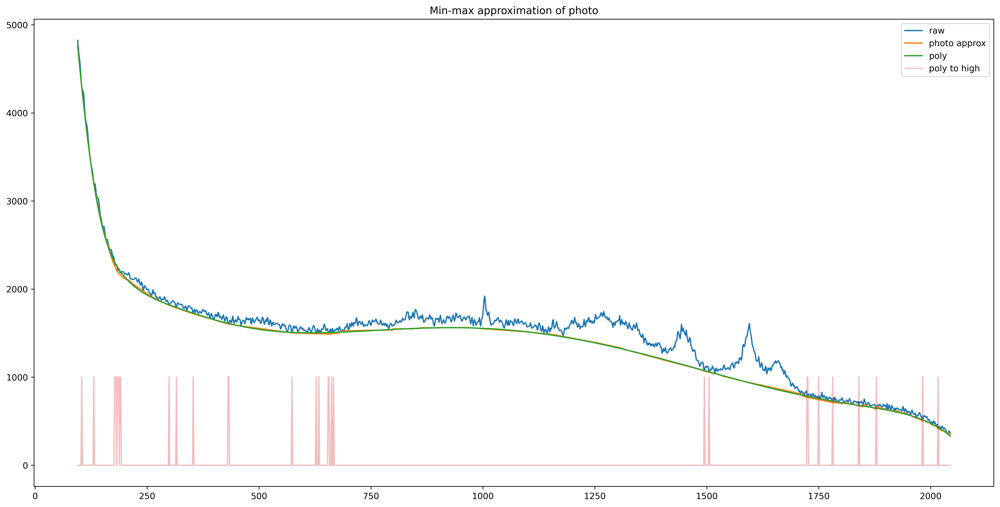

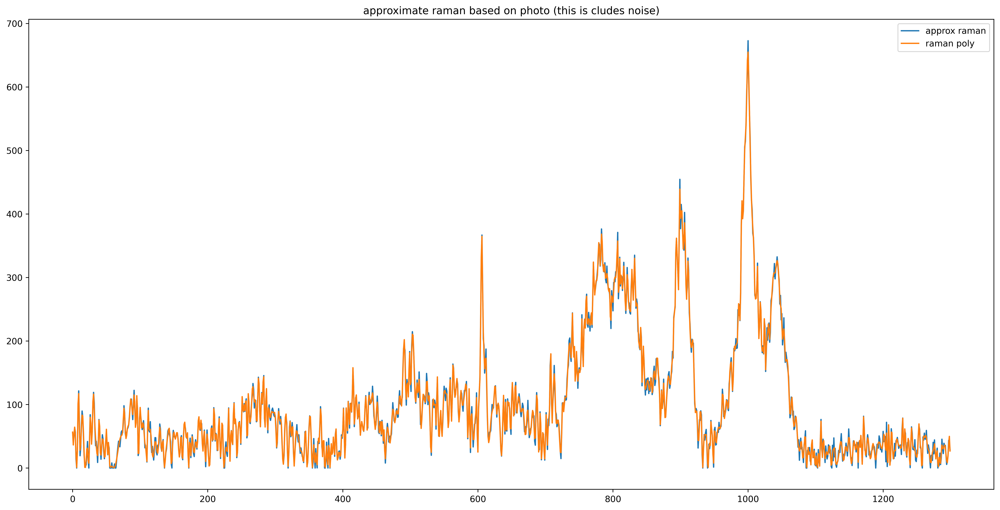

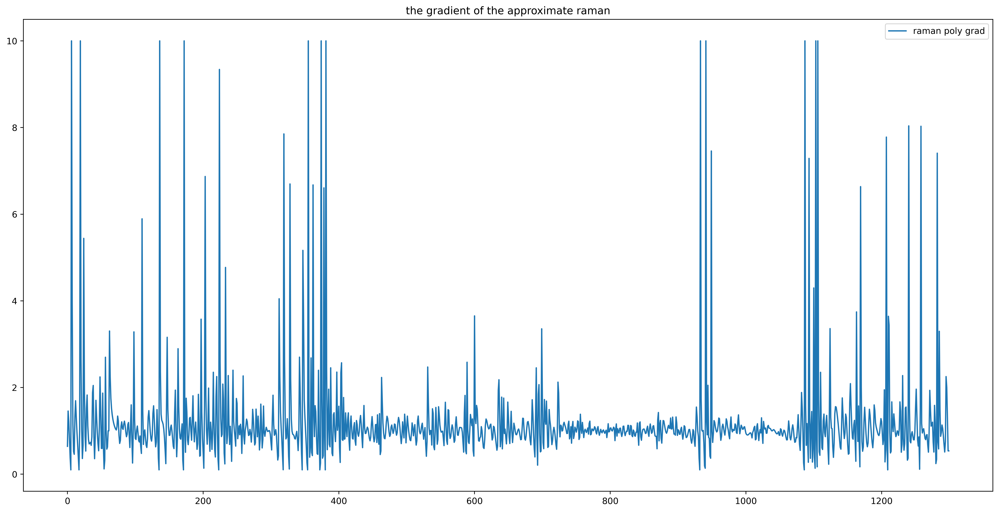

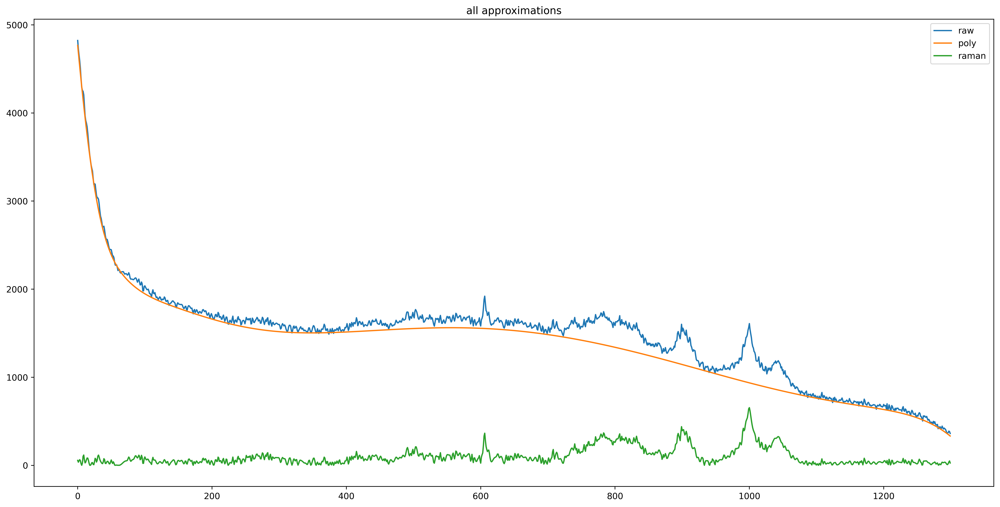

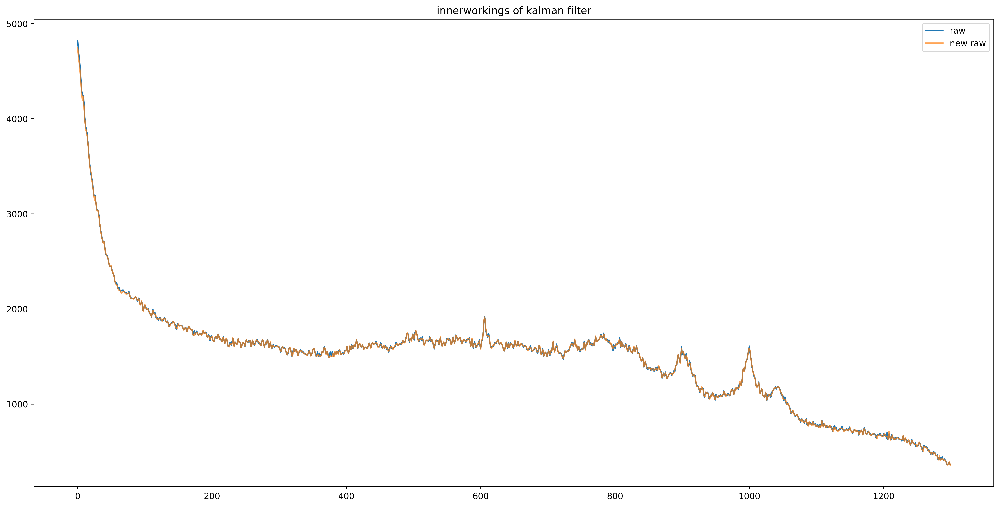

KeyboardInterrupt: 

In [225]:
import timeit
from os import path

file_location2 = f"{'/'.join(file_location.split('/')[:-2])}/approximated/"
os.makedirs(file_location2, exist_ok=True)

shape = data[0][0].shape

for j, (f, img) in enumerate(zip(filenames, data)):   
    start = timeit.default_timer()
#     if path.exists(f'{file_location2}{f.split("/")[-1].split(".")[0]}_raman.npy'):
#         print(f'file already exist {file_location2}{f.split("/")[-1].split(".")[0]}_raman')
#         continue

    if j < 7:
        continue
    
    raman, photo = split_signal(img)

    stop = timeit.default_timer()
    print('Time: ', stop - start)  

    np.save(f'{file_location2}{f.split("/")[-1].split(".")[0]}_raman', raman.reshape(shape))
    np.save(f'{file_location2}{f.split("/")[-1].split(".")[0]}_photoluminescence', photo.reshape(shape))
    print(f"image: {f} is done.")